# Sun-Earth System Simulation

This notebook demonstrates the Solar-Earth two-body model using the `sun_earth` package.
It compares Euler and Leapfrog integration methods and visualizes the orbit.

In [1]:
import sys
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Add src to path so we can import sun_earth
sys.path.append(os.path.abspath('../src'))

from sun_earth.config import G, AU, YEAR, M_EARTH
from sun_earth.model.body import Body
from sun_earth.model.system import SolarSystem
from sun_earth.model.integrators import Integrator
from sun_earth.utils import get_asset_path

## 1. Setup Simulation

We initialize the Sun at the center and Earth at (1 AU, 0) with appropriate velocity for a circular orbit.

In [2]:
def create_system():
    # Sun: Fixed at origin, Mass = 1 (Solar Mass)
    sun = Body(name='Sun', mass=1.0, position=[0, 0], velocity=[0, 0], color='gold', texture_path=get_asset_path('sun.jpg'))
    
    # Earth: Start at x=1 AU, y=0
    # Circular velocity v = sqrt(GM/r). In our units G=4pi^2, M=1, r=1 => v = 2pi
    v_circular = 2 * np.pi
    earth = Body(name='Earth', mass=M_EARTH, position=[1.0, 0], velocity=[0, v_circular], color='blue', texture_path=get_asset_path('earth.jpg'))
    
    return SolarSystem([sun, earth])

## 2. Compare Integrators (Energy Drift)

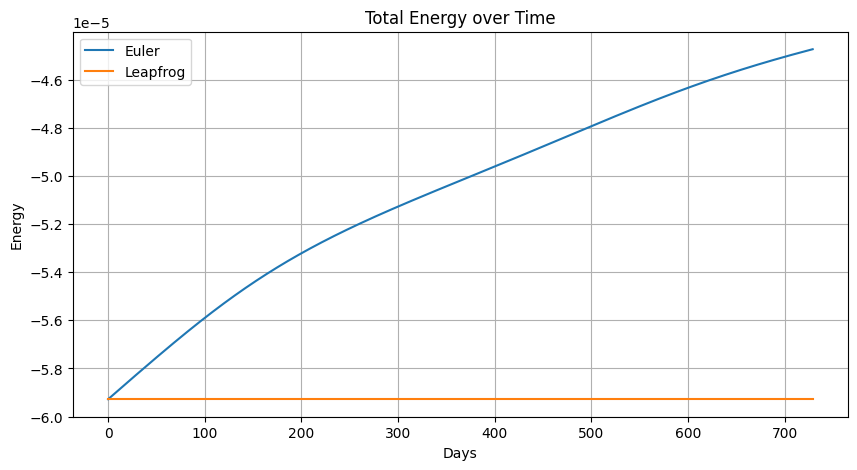

In [3]:
def run_simulation(method, steps=365, dt=1/365):
    system = create_system()
    energy_history = []
    
    # Initial force compute
    system.compute_forces()
    
    for _ in range(steps):
        energy_history.append(system.get_total_energy())
        Integrator.step(system, dt, method=method)
        
    return energy_history

steps = 365 * 2 # 2 Years
dt = 1/365

energy_euler = run_simulation('euler', steps, dt)
energy_leapfrog = run_simulation('leapfrog', steps, dt)

plt.figure(figsize=(10, 5))
plt.plot(energy_euler, label='Euler')
plt.plot(energy_leapfrog, label='Leapfrog')
plt.title('Total Energy over Time')
plt.xlabel('Days')
plt.ylabel('Energy')
plt.legend()
plt.grid(True)
plt.show()

## 3. Visualization

Here we visualize the orbit using Matplotlib animation. We will use Leapfrog for stability.

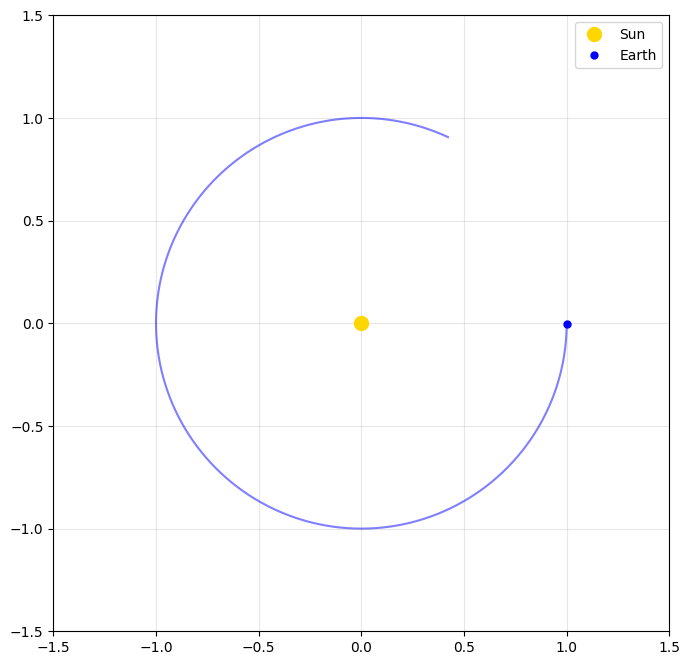

In [4]:
system = create_system()
system.compute_forces()

fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
ax.set_aspect('equal')
ax.grid(True, alpha=0.3)

# Background stars (optional)
# ax.set_facecolor('black')

# Initialize artists
lines = []
points = []

for body in system.bodies:
    line, = ax.plot([], [], '-', color=body.color, alpha=0.5)
    point, = ax.plot([], [], 'o', color=body.color, markersize=10 if body.name == 'Sun' else 5, label=body.name)
    lines.append(line)
    points.append(point)

ax.legend()

def init():
    for line in lines:
        line.set_data([], [])
    for point in points:
        point.set_data([], [])
    return lines + points

def update(frame):
    # Run physics steps per frame to speed up anim
    sim_steps_per_frame = 3
    for _ in range(sim_steps_per_frame):
        Integrator.step(system, dt=1/365, method='leapfrog')
    
    for i, body in enumerate(system.bodies):
        # Update Trail
        # Limit history for plotting speed
        hist = np.array(body.history[-300:]) if len(body.history) > 0 else np.empty((0,2))
        if len(hist) > 0:
            lines[i].set_data(hist[:, 0], hist[:, 1])
        
        # Update Position
        points[i].set_data([body.position[0]], [body.position[1]])
        
    return lines + points

anim = FuncAnimation(fig, update, frames=365, init_func=init, blit=True, interval=20)

# To display in notebook:
HTML(anim.to_jshtml())